## Importing Required Libraries

In [4]:
import numpy as np
import pandas as pd
import os
import cv2
import csv
import random
import tensorflow as tf
import matplotlib.pyplot as plt
import keras
from sklearn.utils import shuffle
from keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm
from skimage import color, data, exposure
from matplotlib.image import imread
from tensorflow import keras
from PIL import Image
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sns
import visualkeras
np.random.seed(42)

%matplotlib inline

from matplotlib import style
style.use('fivethirtyeight')

## Assigning Path for Dataset

In [3]:
data_dir = 'Datasets/GTSRB/'
train_path = 'Datasets/GTSRB/Train/'
test_path = 'Datasets/GTSRB/'

# Resizing the images to 30x30x3
IMG_HEIGHT = 30
IMG_WIDTH = 30
channels = 3

## Mapping Sign Names to Classes

In [4]:
## Create label dictionary {label:signname}
    
labels_dict = None
with open('mapSignnamesToClass.csv', mode='r') as infile:
    reader = csv.reader(infile)
    next(reader, None)
    labels_dict = {int(rows[0]):rows[1] for rows in reader}
    
print(labels_dict)

{0: 'Speed limit (20km/h)', 1: 'Speed limit (30km/h)', 2: 'Speed limit (50km/h)', 3: 'Speed limit (60km/h)', 4: 'Speed limit (70km/h)', 5: 'Speed limit (80km/h)', 6: 'End of speed limit (80km/h)', 7: 'Speed limit (100km/h)', 8: 'Speed limit (120km/h)', 9: 'No passing', 10: 'No passing for vehicles over 3.5 metric tons', 11: 'Right-of-way at the next intersection', 12: 'Priority road', 13: 'Yield', 14: 'Stop', 15: 'No vehicles', 16: 'Vehicles over 3.5 metric tons prohibited', 17: 'No entry', 18: 'General caution', 19: 'Dangerous curve to the left', 20: 'Dangerous curve to the right', 21: 'Double curve', 22: 'Bumpy road', 23: 'Slippery road', 24: 'Road narrows on the right', 25: 'Road work', 26: 'Traffic signals', 27: 'Pedestrians', 28: 'Children crossing', 29: 'Bicycles crossing', 30: 'Beware of ice/snow', 31: 'Wild animals crossing', 32: 'End of all speed and passing limits', 33: 'Turn right ahead', 34: 'Turn left ahead', 35: 'Ahead only', 36: 'Go straight or right', 37: 'Go straight o

## Finding Total Classes

In [5]:
NUM_CATEGORIES = len(os.listdir(train_path))
NUM_CATEGORIES

43

# Step 1: Load The Data

## Collecting the Training Data

In [6]:
image_data = []
image_labels = []

for i in range(NUM_CATEGORIES):
    path = data_dir + '/Train/' + str(i)
    images = os.listdir(path)

    for img in images:
        try:
            image = cv2.imread(path + '/' + img)
            image_fromarray = Image.fromarray(image, 'RGB')
            resize_image = image_fromarray.resize((IMG_HEIGHT, IMG_WIDTH))
            image_data.append(np.array(resize_image))
            image_labels.append(i)
        except:
            print("Error in " + img)

# Changing the list to numpy array
image_data = np.array(image_data)
image_labels = np.array(image_labels)

print(image_data.shape, image_labels.shape)

(39209, 30, 30, 3) (39209,)


## Shuffling the training data

In [7]:
shuffle_indexes = np.arange(image_data.shape[0])
np.random.shuffle(shuffle_indexes)
image_data = image_data[shuffle_indexes]
image_labels = image_labels[shuffle_indexes]

## Splitting the data into train and validation set

In [8]:
X_train, X_val, y_train, y_val = train_test_split(image_data, image_labels, test_size=0.2, random_state=42, shuffle=True)

image_data = None
del image_data
# X_train = X_train/255 
# X_val = X_val/255

print("X_train.shape", X_train.shape)
print("X_valid.shape", X_val.shape)
print("y_train.shape", y_train.shape)
print("y_valid.shape", y_val.shape)

X_train.shape (31367, 30, 30, 3)
X_valid.shape (7842, 30, 30, 3)
y_train.shape (31367,)
y_valid.shape (7842,)


## One hot encoding the labels

In [9]:
#Saving the old y_train and y_val for future use
y_train_old = np.copy(y_train)
y_val_old = np.copy(y_val)

y_train = keras.utils.to_categorical(y_train, NUM_CATEGORIES)
y_val = keras.utils.to_categorical(y_val, NUM_CATEGORIES)

print(y_train.shape)
print(y_val.shape)

(31367, 43)
(7842, 43)


## Collecting the Test Data

In [10]:
test = pd.read_csv(data_dir + 'Test.csv')

labels = test["ClassId"].values
imgs = test["Path"].values

data =[]

for img in imgs:
    try:
        image = cv2.imread(data_dir + '/' +img)
        image_fromarray = Image.fromarray(image, 'RGB')
        resize_image = image_fromarray.resize((IMG_HEIGHT, IMG_WIDTH))
        data.append(np.array(resize_image))
    except:
        print("Error in " + img)
X_test = np.array(data)

# Step 2: Data Summary & Exploratory Data Analysis before Pre-Processing

## Data Size & Shape

In [11]:
n_train = len(X_train)

n_valid = len(X_val)

n_test = len(X_test)

image_shape = X_train.shape[1:]

labels_index = np.unique(y_train_old)
n_labels = len(labels_index)

print("Number of training examples =", n_train)
print("Number of validation examples =", n_valid)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of labels/classes =", n_labels)

Number of training examples = 31367
Number of validation examples = 7842
Number of testing examples = 12630
Image data shape = (30, 30, 3)
Number of labels/classes = 43


## Data Visualization

### Random Image from Training Data with Label

label index and name: [ 3 ]  Speed limit (60km/h)


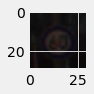

In [12]:
## Show random image and label index

index = random.randint(0, len(X_train))
image = X_train[index].squeeze()

plt.figure(figsize=(1,1))
plt.imshow(image, cmap="gray")
print('label index and name: [', y_train_old[index], '] ', labels_dict[y_train_old[index]])

### 25 Random Images from Test Data

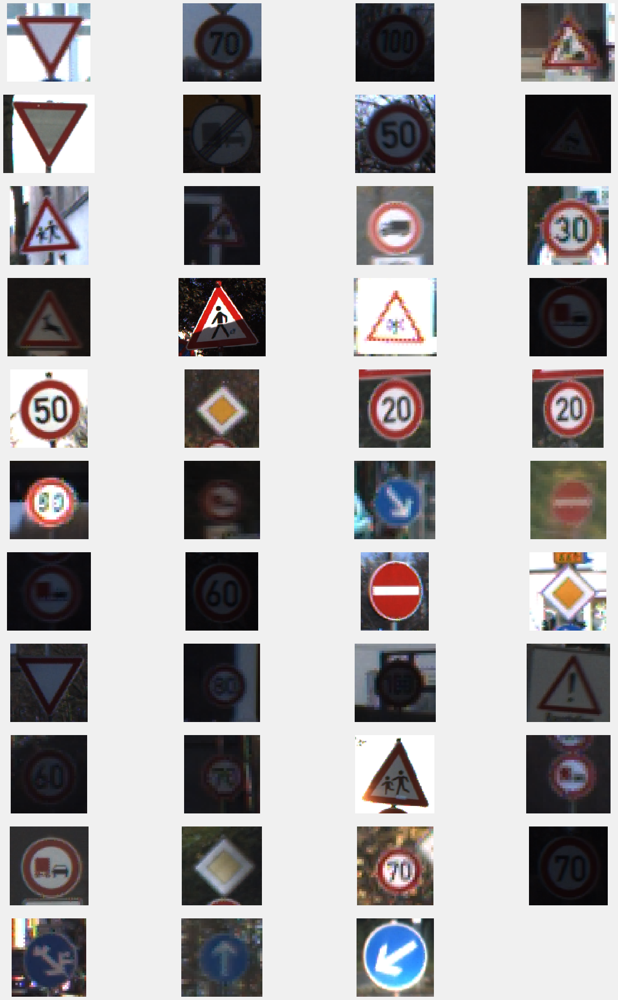

In [13]:
# Visualizing 25 random images from test data
test = pd.read_csv(data_dir + 'Test.csv')
imgs = test["Path"].values

plt.figure(figsize=(22,30), tight_layout={'h_pad':2})

for i in range(NUM_CATEGORIES):
    plt.subplot(int(NUM_CATEGORIES/4)+1,4,i+1)
    random_img_path = data_dir + '/' + random.choice(imgs)
    rand_img = imread(random_img_path)
    plt.imshow(rand_img, interpolation='none')
    plt.grid(visible=0)
    plt.axis('off')

### Image & Label Sample

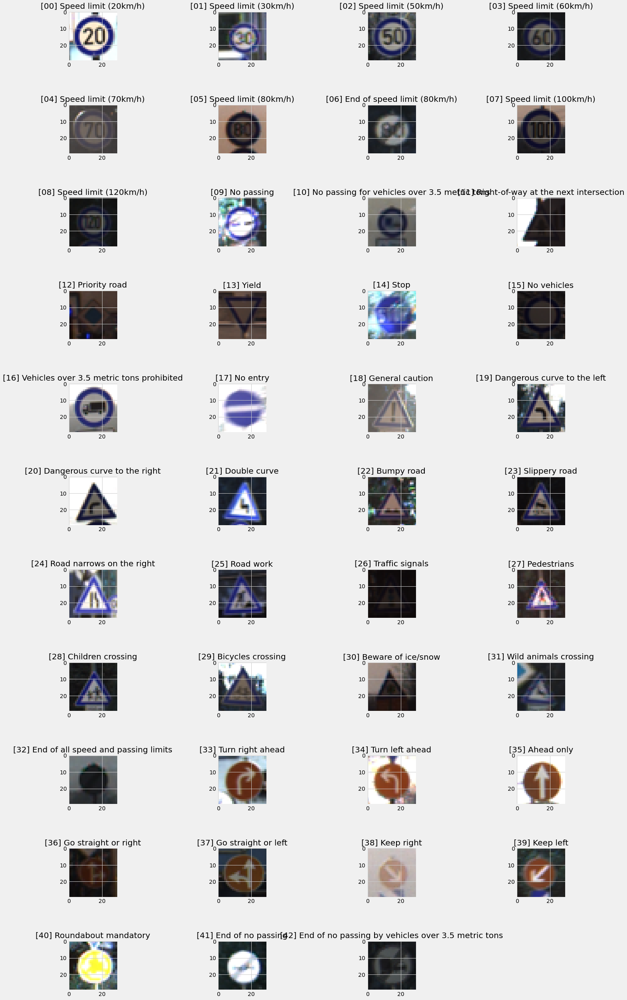

In [14]:
## Display sample of ORIGINAL training images (BEFORE preprocessing)

fig = plt.figure(figsize=(22,35), tight_layout={'h_pad':5})

for i in range(NUM_CATEGORIES):
    image_key = np.where(y_train_old==i)[0][0]
    img = X_train[image_key]
    ax = fig.add_subplot(int(NUM_CATEGORIES/4)+1,4,i+1) 
    ax.imshow(img)
    plt.title("[%02d] %s" % (i, labels_dict[y_train_old[image_key]]))
plt.show()

### Class/Label Distribution

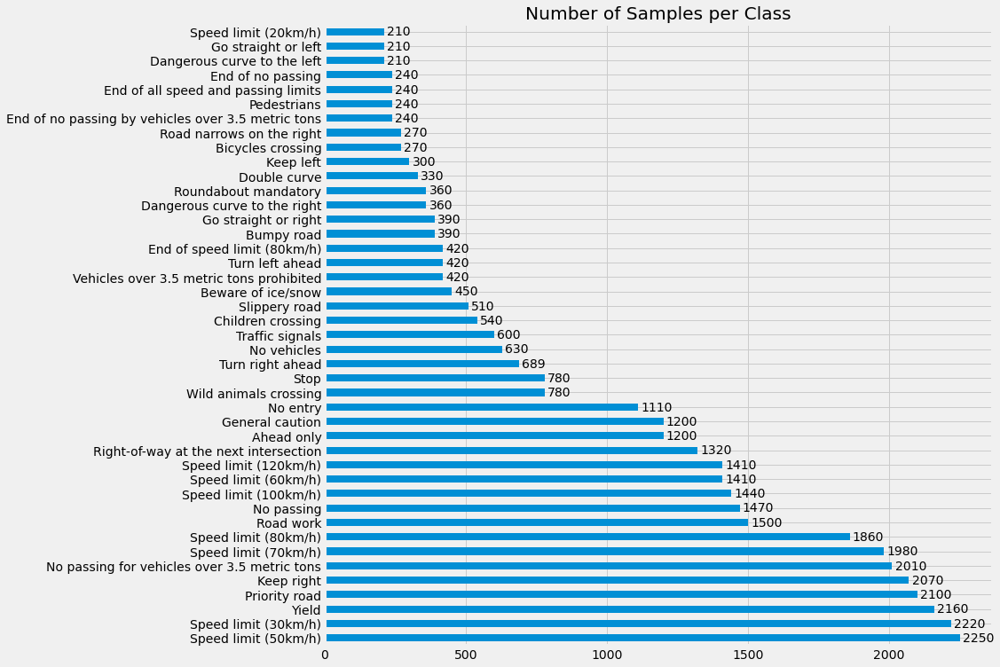

In [15]:
## Display label distribution in a histogram

y_train_df = pd.DataFrame()
y_val_df = pd.DataFrame()
y_train_df['label'] = y_train_old
y_val_df['label'] = y_val_old
y_data_df = pd.concat([y_train_df, y_val_df])
ax = y_data_df['label'].value_counts().plot(kind='barh', figsize = (12,12), title='Number of Samples per Class')
ax.set_yticklabels(list(map(lambda x: labels_dict[x], y_data_df['label'].value_counts().index.tolist())))            
for i, v in enumerate(y_data_df['label'].value_counts()):
    ax.text(v + 10, i - 0.25, str(v), color='black')

In [16]:
labels_i = [[i, sum(y_train_old == i)] for i in range(len(np.unique(y_train_old)))]

data_pd = pd.read_csv('mapSignnamesToClass.csv')
labels_pd = data_pd.set_index('ClassId')

labels_pd['Count'] = pd.Series(np.asarray(labels_i).T[1], index=np.asarray(labels_i).T[0])

labels_pd

,SignName,Count
ClassId,,
0,Speed limit (20km/h),166
1,Speed limit (30km/h),1781
2,Speed limit (50km/h),1776
3,Speed limit (60km/h),1138
4,Speed limit (70km/h),1591
5,Speed limit (80km/h),1490
6,End of speed limit (80km/h),342
7,Speed limit (100km/h),1146
8,Speed limit (120km/h),1117


# Step 3: Data Pre-processing

## Normalization and Contrast Enhancement

In [17]:
# Function that applies normalization and local contrast enhancement
def normalize(image_data):
    '''Contrast Limited Adaptive Histogram Equalization (CLAHE). In addition to regular normalization, 
    this function provides local contrast enhancement -- i.e., details of the image can be 
    enhanced even in regions that are darker or lighter than most of the image.
    http://scikit-image.org/docs/dev/api/skimage.exposure.html#skimage.exposure.equalize_adapthist
    '''
    
    norm = np.array([exposure.equalize_adapthist(image, clip_limit=0.1) for image in tqdm(image_data)])
    return norm

# Run the normalization process

print('Normalizing Training Images...')
X_train_norm = normalize(X_train)

print('Normalizing Validation Images...')
X_val_norm = normalize(X_val)

print('\nNormalizing Test Images...')
X_test_norm = normalize(X_test)

print('\nNormaliztion Complete.')

Normalizing Training Images...


100%|██████████| 31367/31367 [03:01<00:00, 172.81it/s]


Normalizing Validation Images...


100%|██████████| 7842/7842 [00:44<00:00, 175.66it/s]



Normalizing Test Images...


100%|██████████| 12630/12630 [01:17<00:00, 163.45it/s]



Normaliztion Complete.


## Data Augmentation

### Affine and Color Transformations

In [18]:
# Transformations applied to RBG training images
datagen = keras.preprocessing.image.ImageDataGenerator(
    zca_whitening=True,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.15,
    zoom_range=0.15,
    channel_shift_range=0.1,
    fill_mode='nearest',
    horizontal_flip=False,
    vertical_flip=False
)

C:\Users\Toheed Arsal\anaconda3\lib\site-packages\keras\preprocessing\image.py:1446: UserWarning: This ImageDataGenerator specifies `zca_whitening`, which overrides setting of `featurewise_center`.
  warnings.warn(


In [2]:
## Create AUGMENTED training sets

max_images_per_class = 4000
X_train_aug = np.empty((0, 30, 30, 3))
y_train_aug = np.empty(0, dtype='uint8')

print('Augmenting Image Data...')
for i in tqdm(range(n_labels)):
    index = [y_train==i]
    i_class_images = X_train_norm[y_train_old==i]
    i_class_y = y_train_old[y_train_old==i]

    i_X_train_aug = np.copy(i_class_images)
    i_y_train_aug = np.copy(i_class_y)

    for X,y in datagen.flow(i_class_images, i_class_y, batch_size=len(i_class_y), seed=113+i*17):            
        i_X_train_aug = np.append(i_X_train_aug, X, axis=0)
        i_y_train_aug = np.append(i_y_train_aug, y, axis=0)

        if len(i_X_train_aug) >= max_images_per_class:
            break

    X_train_aug = np.append(X_train_aug, i_X_train_aug[:max_images_per_class], axis=0)
    y_train_aug = np.append(y_train_aug, i_y_train_aug[:max_images_per_class], axis=0)              

X_train_aug, y_train_aug = shuffle(X_train_aug, y_train_aug, random_state=113)

print('Augmentation Complete.')
print('New number of training images: ', X_train_aug.shape[0])
print('Verify image shape: ', X_train_aug.shape[1:])

NameError: name 'np' is not defined

# Step 4: Data Summary & Exploratory Data Analysis after Pre-Processing

## Data Size & Shape after Pre-processing

In [1]:
## Verify final data splits

print("Number of training examples =", len(X_train_aug))
print("Number of validation examples =", len(X_val))
print("Number of test examples =", len(X_test))
print("Image data shape =", X_train_aug.shape[1:])
print("Number of labels/classes =", NUM_CATEGORIES)

NameError: name 'X_train_aug' is not defined

## Data Visualization after Pre-processing

### Sample of Normalized training images

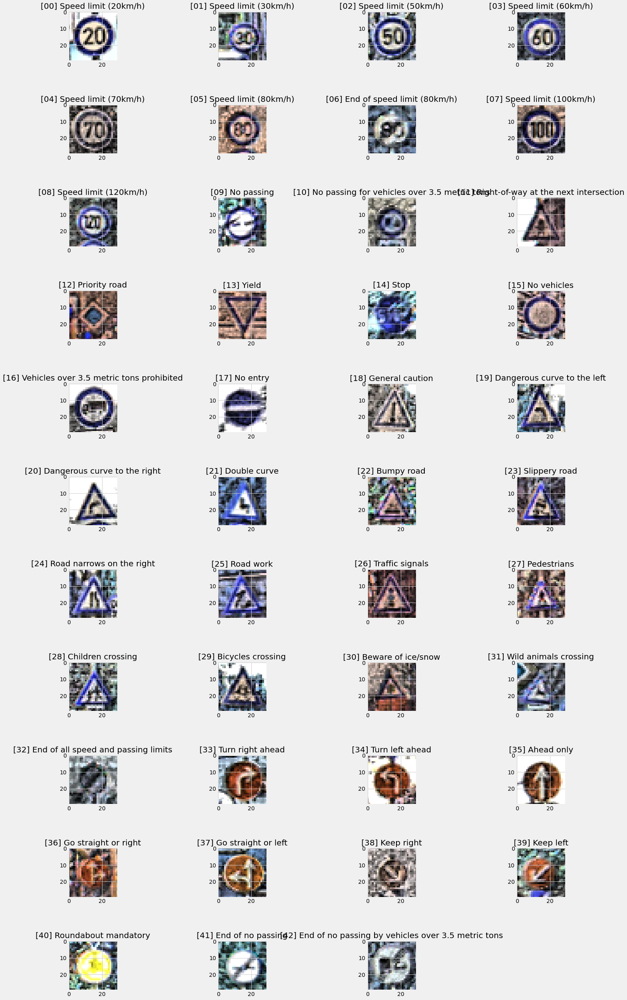

In [20]:
## Display sample of NORMALIZED training images

fig = plt.figure(figsize=(22,35), tight_layout={'h_pad':5})

for i in range(n_labels):
    image_key = np.where(y_train_old==i)[0][0]
    img = X_train_norm[image_key]
    ax = fig.add_subplot(int(NUM_CATEGORIES/4)+1,4,i+1) 
    ax.imshow(img, interpolation='none')
    plt.title("[%02d] %s" % (i, labels_dict[y_train_old[image_key]]))
plt.show()

### Comparison of Original vs Normalized Version

label index:  5


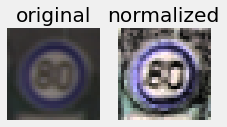

In [21]:
## Display original vs. normalized versions

index = random.randint(0, len(X_train_norm))

image_orig = X_train[index].squeeze()
image_norm = X_train_norm[index].squeeze()

plt.figure(figsize=(5,5))

plt.subplot2grid((1, 3), (0, 0));
plt.axis('off')
plt.title('original')
plt.imshow(image_orig, cmap="gray")

plt.subplot2grid((1, 3), (0, 1));
plt.axis('off')
plt.title('normalized')
plt.imshow(image_norm, cmap="gray")

print('label index: ', y_train_old[index])

### Sample of Augmented Training Images

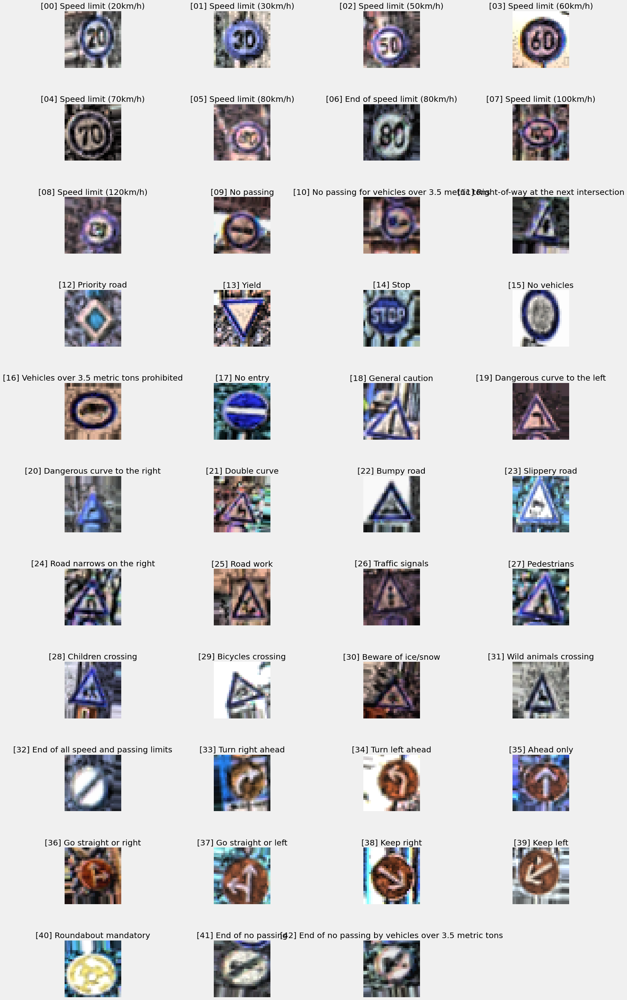

In [22]:
## Display sample of the AUGMENTED training images, 1 image for each class

fig = plt.figure(figsize=(22,35), tight_layout={'h_pad':5})

for i in range(n_labels):
    image_key = np.where(y_train_aug==i)[0][0]
    img = X_train_aug[image_key]
    ax = fig.add_subplot(int(n_labels/4)+1,4,i+1) 
    ax.imshow(img, interpolation='none')
    plt.title("[%02d] %s" % (i, labels_dict[y_train_aug[image_key]]))
    plt.axis('off')
plt.show()

### 12 Random images from each class from Augmented Training Images

[5] Speed limit (80km/h)


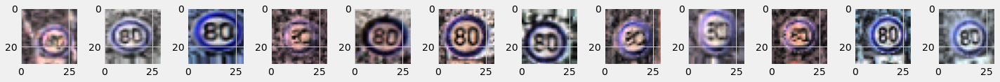

[26] Traffic signals


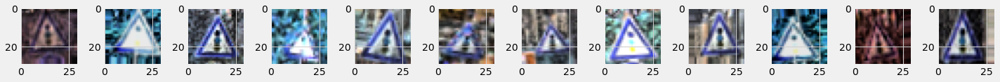

[9] No passing


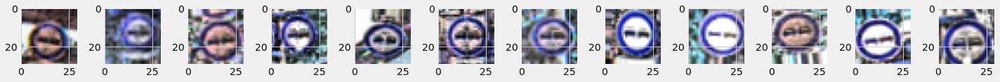

[25] Road work


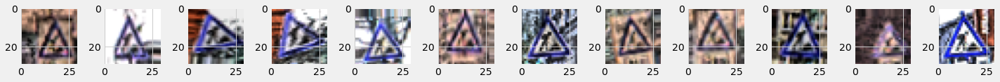

[31] Wild animals crossing


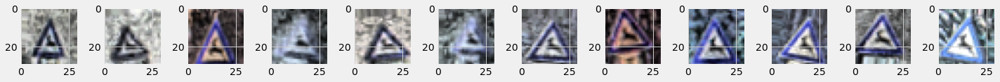

[29] Bicycles crossing


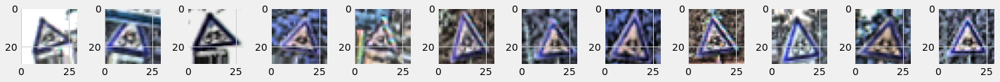

[15] No vehicles


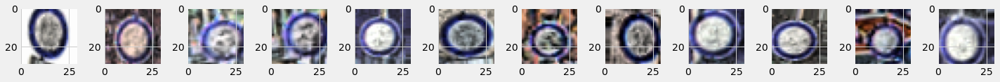

[8] Speed limit (120km/h)


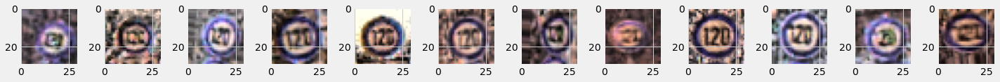

[6] End of speed limit (80km/h)


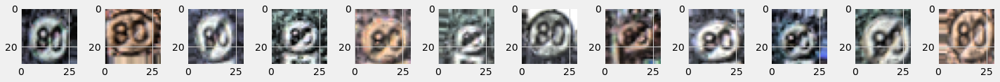

[39] Keep left


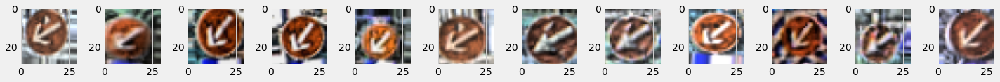

[1] Speed limit (30km/h)


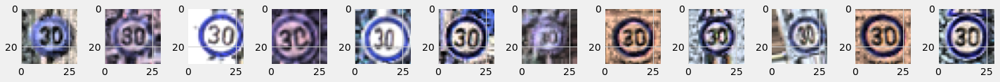

[41] End of no passing


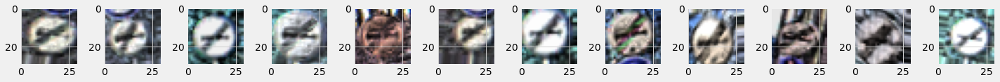

[10] No passing for vehicles over 3.5 metric tons


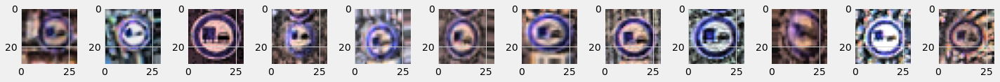

[38] Keep right


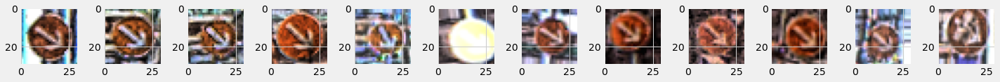

[36] Go straight or right


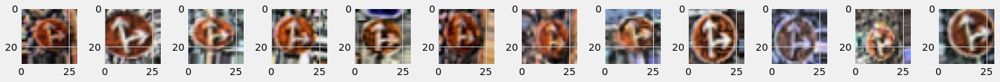

[24] Road narrows on the right


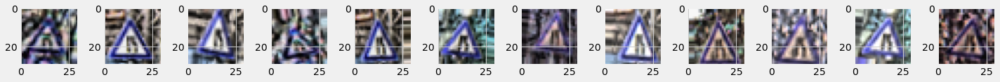

[7] Speed limit (100km/h)


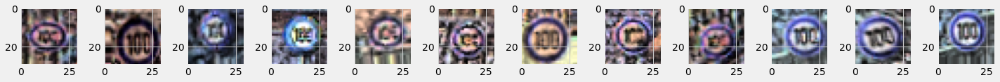

[40] Roundabout mandatory


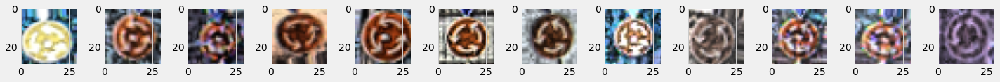

[11] Right-of-way at the next intersection


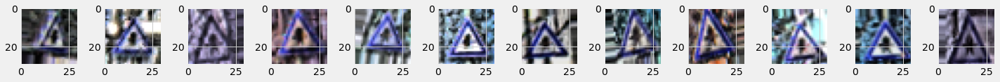

[17] No entry


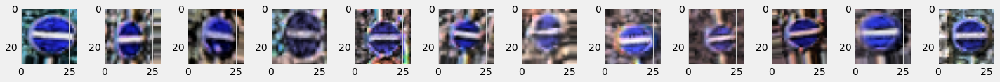

[35] Ahead only


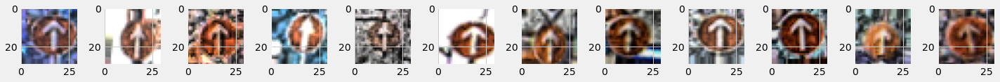

[21] Double curve


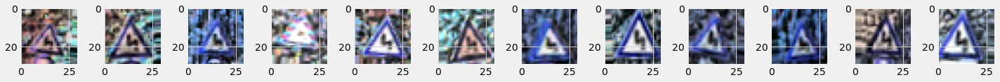

[2] Speed limit (50km/h)


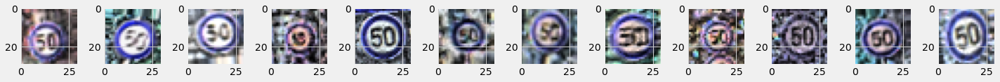

[18] General caution


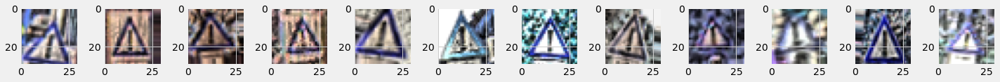

[14] Stop


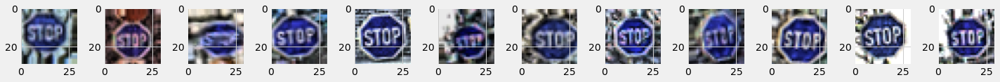

[42] End of no passing by vehicles over 3.5 metric tons


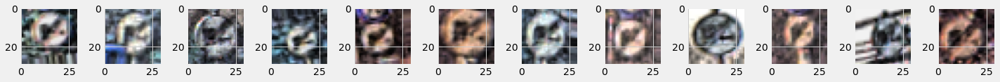

[0] Speed limit (20km/h)


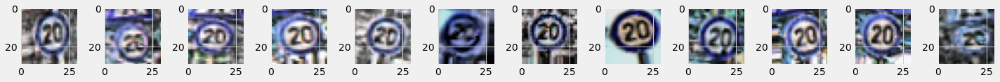

[37] Go straight or left


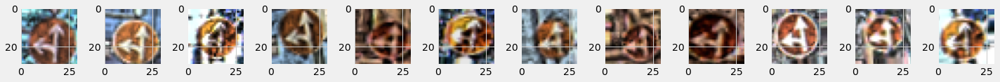

[33] Turn right ahead


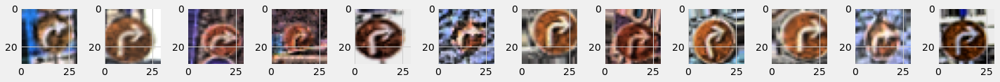

[23] Slippery road


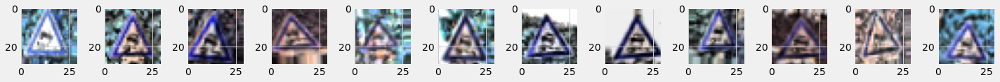

[12] Priority road


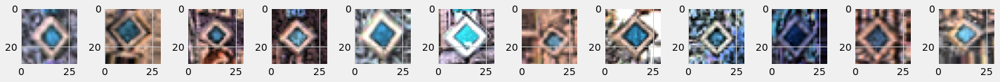

[34] Turn left ahead


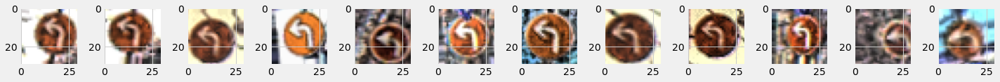

[28] Children crossing


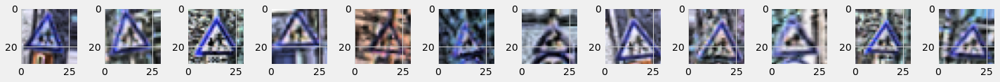

[20] Dangerous curve to the right


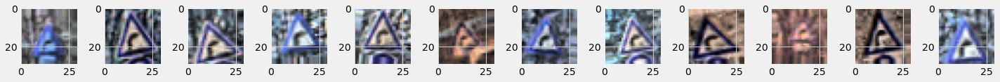

[22] Bumpy road


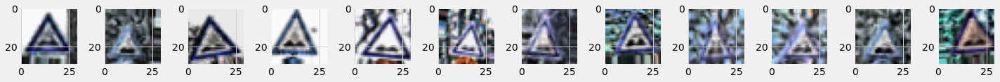

[3] Speed limit (60km/h)


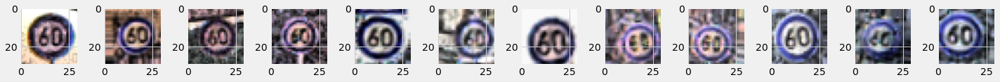

[4] Speed limit (70km/h)


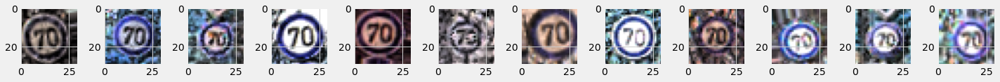

[32] End of all speed and passing limits


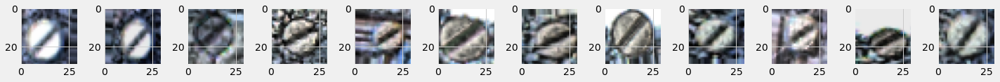

[30] Beware of ice/snow


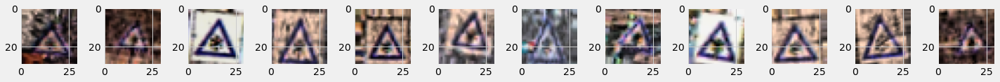

[13] Yield


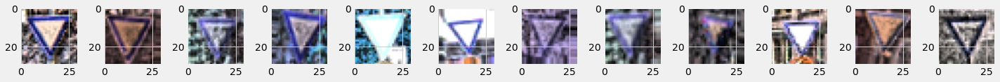

[16] Vehicles over 3.5 metric tons prohibited


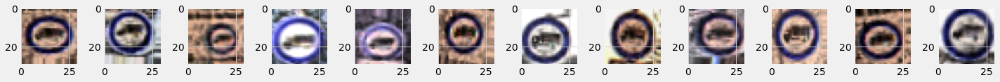

[19] Dangerous curve to the left


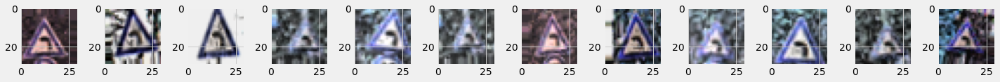

[27] Pedestrians


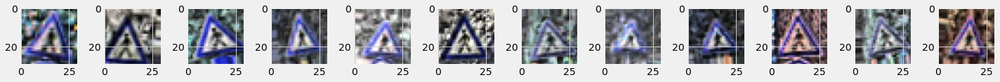

In [23]:
# Create image dictionary {label:images}

train_images_dict = dict()

for i, (image, label) in enumerate(zip(X_train_aug, y_train_aug)):
    if label not in train_images_dict:
        train_images_dict[label] = []
    train_images_dict[label].append(image)

## Display a broader sample of AUGMENTED images, 12 from each class
import matplotlib
matplotlib.rcParams['figure.figsize'] = (20.0, 10.0)

images_labels = list(train_images_dict.keys())
for image_key in images_labels:        
    subplots = 12
    fig, axes = plt.subplots(1,subplots)
    images_total = len(train_images_dict[image_key])
    print('[{}] {}'.format(image_key, labels_dict[image_key]))
    offset = images_total // subplots
    images = [train_images_dict[image_key][j*offset] for j in range(subplots)]
    for i, (image, ax) in enumerate(zip(images, axes)):
        ax.imshow(image.squeeze())
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.show()

train_images_dict.clear()

### Image/Class Distribution

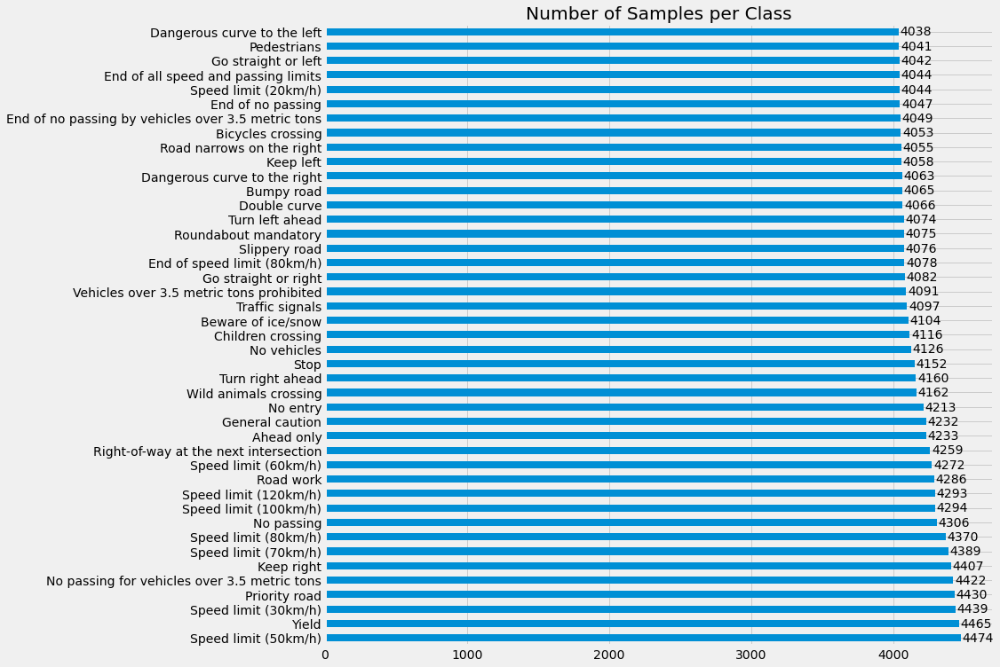

In [24]:
## Display label distribution in a histogram

y_train_df = pd.DataFrame()
y_val_df = pd.DataFrame()
y_train_df['label'] = y_train_aug
y_val_df['label'] = y_val_old
y_data_df = pd.concat([y_train_df, y_val_df])
ax = y_data_df['label'].value_counts().plot(kind='barh', figsize = (12,12), title='Number of Samples per Class')
ax.set_yticklabels(list(map(lambda x: labels_dict[x], y_data_df['label'].value_counts().index.tolist())))            
for i, v in enumerate(y_data_df['label'].value_counts()):
    ax.text(v + 10, i - 0.25, str(v), color='black')

# Step 5: Merging Augmented Training Set with Original Training Set

In [25]:
# Persisting old training set for future reference
# X_train_original = np.copy(X_train)
# y_train_original = np.copy(y_train)

# Freeing up old memory
X_train = None
y_train = None
X_train_norm = None
X_val_norm = None
X_test_norm = None
del X_train_norm
del X_val_norm
del X_test_norm

X_train = np.copy(X_train_aug)
y_train = np.copy(y_train_aug)

X_train_aug = None
y_train_aug = None
del X_train_aug
del y_train_aug

print("X_train.shape", X_train.shape)
print("X_valid.shape", X_val.shape)
print("y_train.shape", y_train.shape)
print("y_valid.shape", y_val.shape)

X_train.shape (172000, 30, 30, 3)
X_valid.shape (7842, 30, 30, 3)
y_train.shape (172000,)
y_valid.shape (7842, 43)


In [26]:
# One hot encoding new training set

#Saving the old y_train and y_val for future use
y_train_old = np.copy(y_train)

y_train = keras.utils.to_categorical(y_train, NUM_CATEGORIES)

print(y_train.shape)

(172000, 43)


# Step 6: Model

## Buidling the model

In [5]:
model = keras.models.Sequential([    
    keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', input_shape=(IMG_HEIGHT,IMG_WIDTH,channels)),
    keras.layers.Conv2D(filters=32, kernel_size=(3,3), activation='relu'),
    keras.layers.MaxPool2D(pool_size=(2, 2)),
    keras.layers.BatchNormalization(axis=-1),
    
    keras.layers.Conv2D(filters=64, kernel_size=(3,3), activation='relu'),
    keras.layers.Conv2D(filters=128, kernel_size=(3,3), activation='relu'),
    keras.layers.MaxPool2D(pool_size=(2, 2)),
    keras.layers.BatchNormalization(axis=-1),
    
    keras.layers.Flatten(),
    keras.layers.Dense(512, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(rate=0.5),
    
    keras.layers.Dense(43, activation='softmax')
])

NameError: name 'IMG_HEIGHT' is not defined

In [ ]:
#compiling the model
lr = 0.001
epochs = 30
opt = Adam(lr=lr, decay=lr / (epochs * 0.5))
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])


In [ ]:
#summary of the model
model.summary()

In [ ]:
#layered view of model
visualkeras.layered_view(model)

## Augmenting the data and training the model

In [ ]:
# aug = ImageDataGenerator(
#     rotation_range=10,
#     zoom_range=0.15,
#     width_shift_range=0.1,
#     height_shift_range=0.1,
#     shear_range=0.15,
#     horizontal_flip=False,
#     vertical_flip=False,
#     fill_mode="nearest")

# history = model.fit(aug.flow(X_train, y_train, batch_size=32), epochs=epochs, validation_data=(X_val, y_val))
history = model.fit(X_train, y_train, batch_size=32, epochs=epochs, validation_data=(X_val, y_val))


## Evaluating the model

In [ ]:
#plotting the graphs for accuracy
plt.plot(history.history['accuracy'], label='training accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

In [ ]:
plt.plot(history.history['loss'], label='training loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

## Loading the test data and running the predictions

In [ ]:
test = pd.read_csv(data_dir + '/Test.csv')

labels = test["ClassId"].values
imgs = test["Path"].values

data =[]

for img in imgs:
    try:
        image = cv2.imread(data_dir + '/' +img)
        image_fromarray = Image.fromarray(image, 'RGB')
        resize_image = image_fromarray.resize((IMG_HEIGHT, IMG_WIDTH))
        data.append(np.array(resize_image))
    except:
        print("Error in " + img)
X_test = np.array(data)
X_test = X_test/255

pred=np.argmax(model.predict(X_test), axis=-1)

#Accuracy with the test data
print('Test Data accuracy: ',accuracy_score(labels, pred)*100)

## Visualizing the confusion matrix

In [ ]:
#making confusion matrix
cf = confusion_matrix(labels, pred)
cf
#visualizing
df_cm = pd.DataFrame(cf, index = classes,  columns = classes)
plt.figure(figsize = (20,20))
sns.heatmap(df_cm, annot=True)

##  Classification report

In [ ]:
print(classification_report(labels, pred))

## Predictions on Test Data

In [ ]:
start_index = 0
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    prediction = pred[start_index + i]
    actual = labels[start_index + i]
    col = 'g'
    if prediction != actual:
        col = 'r'
    plt.xlabel('Actual={} || Pred={}'.format(actual, prediction), color = col)
    plt.imshow(X_test[start_index + i])
plt.show()